In [1]:
import scanpy as sc
import numpy as np 
import pandas as pd
import time 

In [2]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
### Full list of variables vvv
# sc.logging.print_versions()
### just the important ones
sc.logging.print_header()
### setting some important parameters 
sc.settings.set_figure_params(dpi=1080, frameon=False, figsize=(3, 3), facecolor='white')

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.2 scipy==1.5.2 pandas==1.1.3 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.8.3 leidenalg==0.8.3


In [3]:
# read in
adata = sc.read_h5ad("/Users/aliheydari/Box/R15_collab_project/Trajectory_analysis/data/Seurat Data/GSE141784_analysis_scaled.h5ad")

# inspect
adata

AnnData object with n_obs × n_vars = 26393 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Barcode', 'Cells', 'Sample', 'Batch', 'Library', 'percent.mito', 'cell.cycle', 'percent.ribo'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_pca'
    varm: 'PCs'

In [4]:
# getting Bcells, CD4 and CD8
immune_idx = []

for i in range(0,len(adata.obs['Cells'])):
    
    if adata.obs['Cells'][i] == 'Bcell' or adata.obs['Cells'][i] == 'CD4' or adata.obs['Cells'][i] == 'CD8' :
        immune_idx.append(i)

In [5]:
adata_im = adata[immune_idx]
# inspect
adata_im

View of AnnData object with n_obs × n_vars = 4977 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Barcode', 'Cells', 'Sample', 'Batch', 'Library', 'percent.mito', 'cell.cycle', 'percent.ribo'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_pca'
    varm: 'PCs'

## Trajectory Analysis of Immune Cells

In [6]:
start = time.time();
sc.tl.pca(adata_im, svd_solver='arpack')
print(f"PCA time: {time.time() - start}")

computing PCA
    with n_comps=50
    finished (0:00:01)
PCA time: 1.3984229564666748


In [7]:
start = time.time();
sc.pp.neighbors(adata_im, n_neighbors=4, n_pcs=20)
sc.tl.draw_graph(adata_im)
print(f"Graph clustering time: {time.time() - start}")

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:21)
Graph clustering time: 23.77560305595398


... storing 'Cells' as categorical
... storing 'Sample' as categorical
... storing 'cell.cycle' as categorical


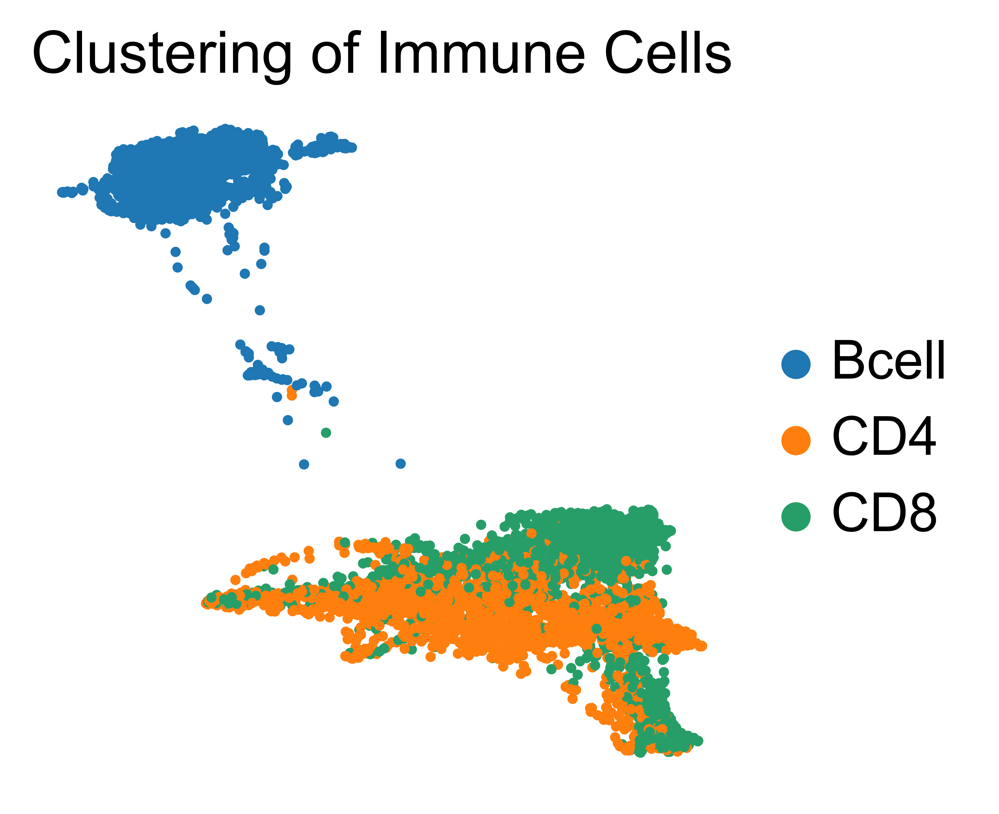

In [8]:
sc.pl.draw_graph(adata_im, color = 'Cells', title="Clustering of Immune Cells")

In [9]:
sc.tl.diffmap(adata_im)
sc.pp.neighbors(adata_im, n_neighbors=10, use_rep='X_diffmap')

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9998249  0.9932658  0.99093294 0.98867613 0.9868953
     0.983722   0.9797107  0.97677636 0.974757   0.9742243  0.96951014
     0.9666456  0.9653785  0.9640685 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [10]:
sc.tl.draw_graph(adata_im)

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:21)


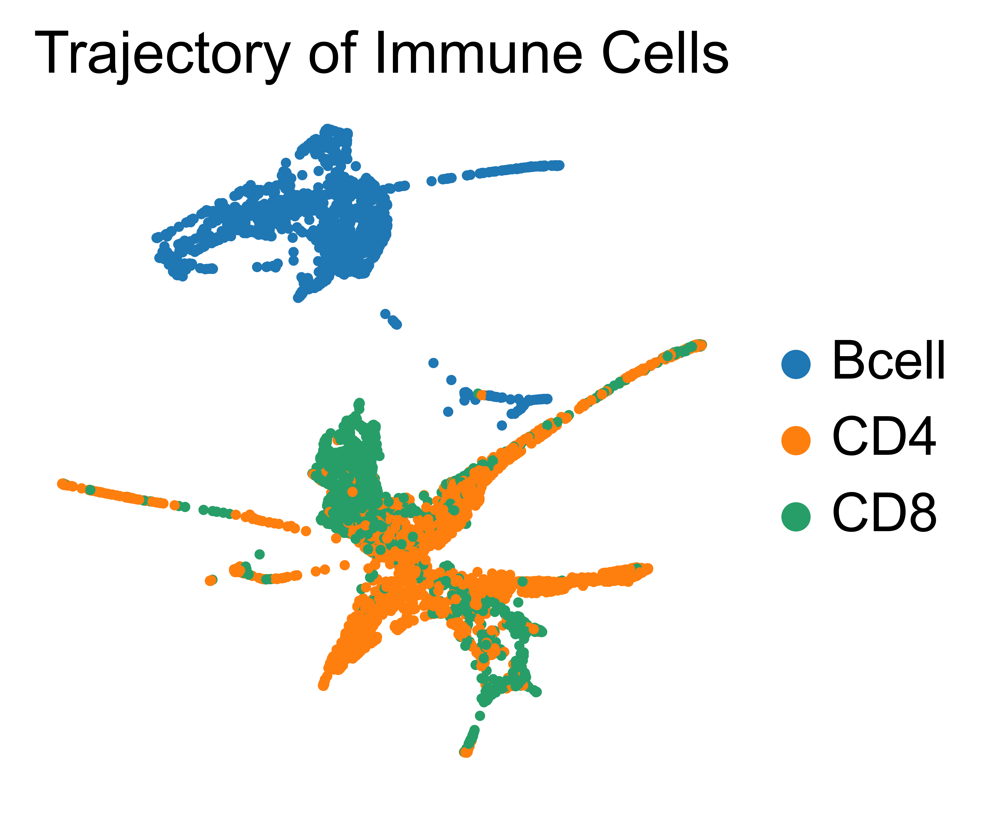

In [11]:
sc.pl.draw_graph(adata_im, color='Cells', title="Trajectory of Immune Cells")

In [23]:
sc.tl.leiden(adata_im, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata_im, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata_im, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata_im, resolution = 1.4, key_added = "leiden_1.4")
sc.tl.leiden(adata_im, resolution = 0.2, key_added = "leiden_0.2")

running Leiden clustering
    finished: found 33 clusters and added
    'leiden_1.0', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 42 clusters and added
    'leiden_1.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)


In [28]:
sc.pl.draw_graph(adata_im, color=['leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_1.0','leiden_1.4'],
                title="Clusters with Various Leiden Resolutions", save="Leiden_Clust_VarRes")

In [35]:
sc.pl.draw_graph(adata_im, color='leiden_0.4',
                title="Leidem Clusters with Res=0.4", save="Leiden_Clust_Res04.png")

In [31]:
sc.tl.paga(adata_im, groups='leiden_0.4')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


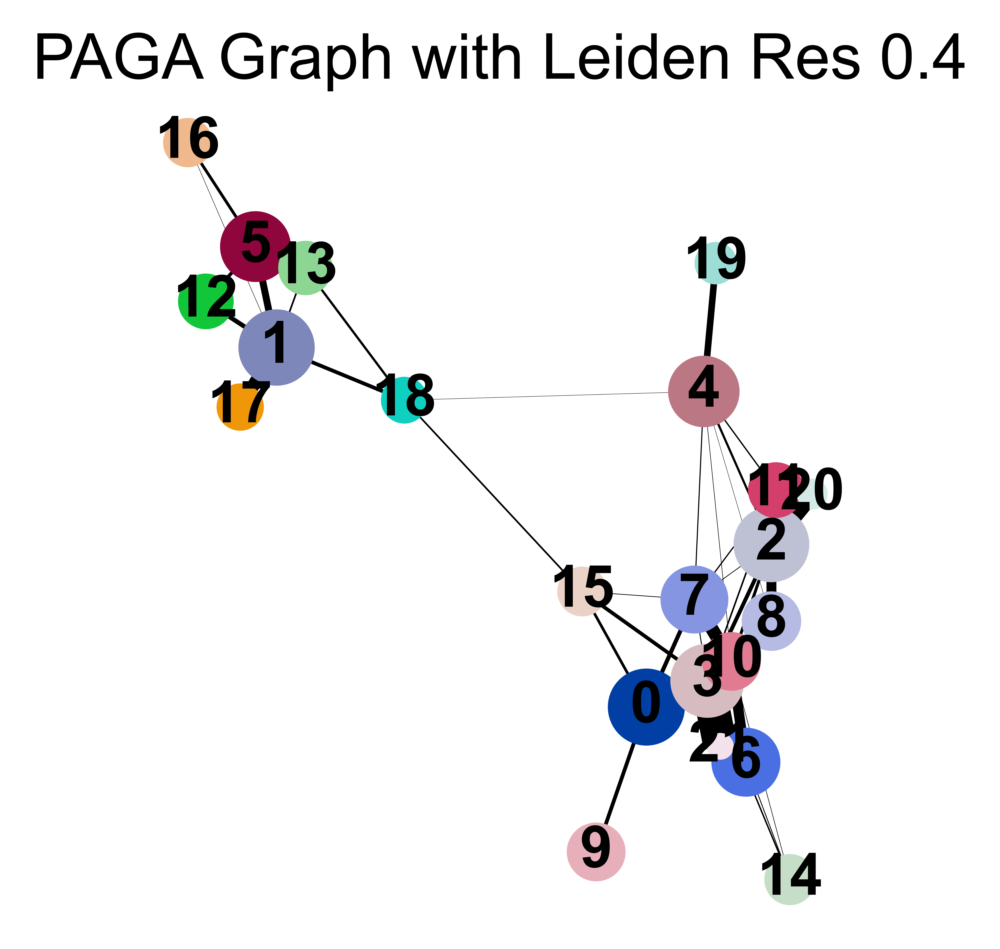

In [33]:
sc.pl.paga(adata_im, color=['leiden_0.4'], title="PAGA Graph with Leiden Res 0.4", save="PAGA_LeidenRes04.png")